BOE_CHIU Dataset

In [1]:
import os
import scipy.io as sp
import cv2
import skimage
import numpy as np
import matplotlib.pyplot as plt

In [2]:
FILE_PATH = "data\datasets\segmentation_of_oct_images_dme/2015_BOE_Chiu\Subject_02.mat"

In [3]:
oct = sp.loadmat(FILE_PATH)
print(oct.keys())

dict_keys(['__header__', '__version__', '__globals__', 'images', 'automaticFluidDME', 'manualFluid1', 'manualFluid2', 'automaticLayersDME', 'automaticLayersNormal', 'manualLayers1', 'manualLayers2'])


In [4]:
image_tensor = oct["images"]
auto_fluid = oct["automaticFluidDME"]
fluid_tensor_1 = oct["manualFluid1"]
fluid_tensor_2 = oct["manualFluid2"]
auto_layers_dme = oct["automaticLayersDME"]
auto_layers_norm = oct["automaticLayersNormal"]
manual_layers_1 = oct["manualLayers1"]
manual_layers_2 = oct["manualLayers2"]

all_images = [image_tensor, auto_fluid, fluid_tensor_1, fluid_tensor_2, auto_layers_dme, auto_layers_norm, manual_layers_1, manual_layers_2]

for i, image in enumerate(all_images):
    print(f" {list(oct.keys())[i+3]} Shape: ", image.shape)

 images Shape:  (496, 768, 61)
 automaticFluidDME Shape:  (496, 768, 61)
 manualFluid1 Shape:  (496, 768, 61)
 manualFluid2 Shape:  (496, 768, 61)
 automaticLayersDME Shape:  (8, 768, 61)
 automaticLayersNormal Shape:  (8, 768, 61)
 manualLayers1 Shape:  (8, 768, 61)
 manualLayers2 Shape:  (8, 768, 61)


In [5]:
fluid_class = 9
oct = sp.loadmat(FILE_PATH)

def get_valid_idx(manualLayer):

    # finds the manual layers that are not "0"

    idx = []
    for i in range(0,61):
        temp = manualLayer[:,:,i]
        if np.sum(temp) != 0:
            idx.append(i)
    return idx

def get_valid_img_seg(mat):
    manualLayer = np.array(mat['manualLayers2'], dtype=np.uint16)
    manualFluid = np.array(mat['manualFluid2'], dtype=np.uint16)
    images = np.array(mat['images'], dtype=np.uint8)

    # print("original image shape", images.shape)
    # print("original manual layer shape", manualLayer.shape)
    # print("original manual fluid shape", manualFluid.shape)

    valid_idx = get_valid_idx(manualLayer)
    # print("valid idx: ", valid_idx)

    images = images[..., valid_idx]
    manualFluid = manualFluid[:, :, valid_idx]
    manualLayer = manualLayer[:, :, valid_idx]
    # print("processed image shape", images.shape)
    # print("processed manual fluid shape: ", manualFluid.shape)
    # print("processed manual layer shape: ", manualLayer.shape)

    seg = np.zeros((496, 768, 11))
    seg[manualFluid > 0] = fluid_class
    max_col = -100
    min_col = 900

    for b_scan_idx in range(0, 11):
        for col in range(768):
            cur_col = manualLayer[:, col, b_scan_idx]
            if np.sum(cur_col) == 0:
                continue

            max_col = max(max_col, col)
            min_col = min(min_col, col)

            labels_idx = cur_col.tolist()
            last_st = None
            last_ed = None

            for label, (st, ed) in enumerate(zip([0]+labels_idx, labels_idx+[-1])):
                if st == 0 and ed == 0:
                    st = last_ed
                    while(seg[st, col, b_scan_idx] == fluid_class):
                        st += 1

                    while(seg[st, col, b_scan_idx] != fluid_class):
                        seg[st, col, b_scan_idx] = label
                        st += 1
                        if st >= 496:
                            break
                    continue
                if ed == 0:
                    ed = st + 1
                    while(seg[ed, col, b_scan_idx] != fluid_class):
                        ed += 1

                if st == 0 and label != 0:
                    st = ed-1
                    while(seg[st, col, b_scan_idx] != fluid_class):
                        st -= 1
                    st += 1

                seg[st:ed, col, b_scan_idx] = label
                last_st = st
                last_ed = ed

    seg[manualFluid > 0] = fluid_class
    
    seg = seg[:, min_col:max_col+1]
    images = images[:, min_col:max_col+1]
    return images, seg

images, segmentations = get_valid_img_seg(oct)

print("output iamges shaep", images.shape)
print("output segmentations shape", segmentations.shape)

output iamges shaep (496, 524, 11)
output segmentations shape (496, 524, 11)


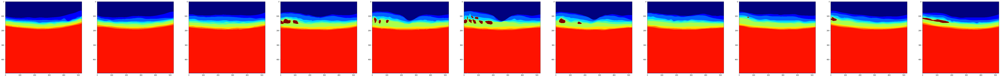

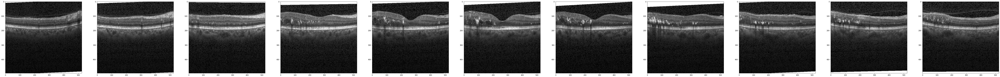

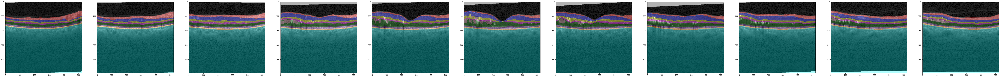

In [6]:
fig = plt.figure(figsize=(110, 20))
x, y = 1, segmentations.shape[2]

for i in range(int(segmentations.shape[2])):
    fig.add_subplot(x, y, i+1)
    plt.imshow(segmentations[..., i], cmap=plt.cm.jet, vmax=9)
plt.show()

fig = plt.figure(figsize=(110, 20))
x, y = 1, images.shape[2]

for i in range(int(images.shape[2])):
    fig.add_subplot(x, y, i+1)
    plt.imshow(images[..., i], cmap="gray")
plt.show()

fig = plt.figure(figsize=(110, 20))
x, y = 1, images.shape[2]

for i in range(int(images.shape[2])):
    fig.add_subplot(x, y, i+1)
    plt.imshow(skimage.color.label2rgb(segmentations[..., i], images[..., i]))
plt.show()

In [7]:
"""
output = "data/datasets/segmented_layers"
DIR_PATH = "data\datasets\segmentation_of_oct_images_dme/2015_BOE_Chiu"

counter = 0
for oct_mat in os.listdir(DIR_PATH):
    file_path = os.path.join(DIR_PATH, oct_mat)

    oct = sp.loadmat(file_path)
    images, segmentations = get_valid_img_seg(oct)

    for i in range(int(segmentations.shape[2])):
        plt.imsave(
            os.path.join(output, f"segmentation_{str(counter).zfill(3)}.jpg"),
            segmentations[..., i], cmap=plt.cm.jet, vmax=9)
        plt.imsave(
            os.path.join(output, f"image_{str(counter).zfill(3)}.jpg"),
            images[..., i], cmap="gray")

        counter = counter + 1
"""

'\noutput = "data/datasets/segmented_layers"\nDIR_PATH = "data\\datasets\\segmentation_of_oct_images_dme/2015_BOE_Chiu"\n\ncounter = 0\nfor oct_mat in os.listdir(DIR_PATH):\n    file_path = os.path.join(DIR_PATH, oct_mat)\n\n    oct = sp.loadmat(file_path)\n    images, segmentations = get_valid_img_seg(oct)\n\n    for i in range(int(segmentations.shape[2])):\n        plt.imsave(\n            os.path.join(output, f"segmentation_{str(counter).zfill(3)}.jpg"),\n            segmentations[..., i], cmap=plt.cm.jet, vmax=9)\n        plt.imsave(\n            os.path.join(output, f"image_{str(counter).zfill(3)}.jpg"),\n            images[..., i], cmap="gray")\n\n        counter = counter + 1\n'

Retinal OCT and OCTA Data (Processed)
Citation: Bélanger Nzakimuena, C. (2020). Automated Analysis of Retinal and Choroidal OCT and OCTA Images in AMD (Masters thesis, Polytechnique Montréal). Retrieved from https://publications.polymtl.ca/5234/

In [8]:
FILE_PATH = "data\datasets/retinal_and_octa_processed\processed\subject1\Results/3mmx3mm_20180831130749_OS\segmentationAlligned.mat"

In [10]:
oct = sp.loadmat(FILE_PATH)
print(oct.keys())

dict_keys(['__header__', '__version__', '__globals__', 'RPE1', 'RPE2', 'avgScans', 'RVI'])


In [11]:
print(oct["RPE1"].shape)
print(oct["RPE2"].shape)
print(oct["avgScans"].shape)
print(oct["RVI"].shape)

(300, 1527)
(300, 1527)
(1536, 1527, 300)
(300, 1527)


In [12]:
avg_scans = np.transpose(oct["avgScans"], (2, 0, 1))
print(avg_scans.shape)

(300, 1536, 1527)


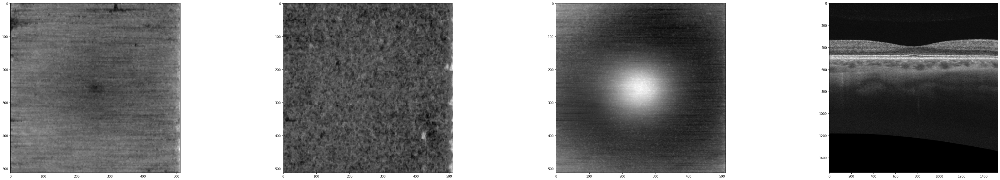

In [13]:
fig = plt.figure(figsize=(60, 10))
x, y = 1, 4
fig.add_subplot(x, y, 1)
plt.imshow(cv2.resize(oct["RPE1"], (512, 512)), cmap="gray")
fig.add_subplot(x, y, 2)
plt.imshow(cv2.resize(oct["RPE2"], (512, 512)), cmap="gray")
fig.add_subplot(x, y, 3)
plt.imshow(cv2.resize(oct["RVI"], (512, 512)), cmap="gray")
fig.add_subplot(x, y, 4)
plt.imshow(avg_scans[150], cmap="gray")
plt.show()

Multiscale GCN Dataset

Dataset info: RNFL=26, GCL=51, IPL=77, INL=102, OPL=128, ONL=153, IS/OS=179, RPE=204, Choroid=230, Optic Disc=255

In [21]:
gcn_dataset = "data/datasets/oct_dataset/train"
image = "img"
label = "mask"

all_files = [x[:-4]for x in os.listdir(os.path.join(gcn_dataset, image))]

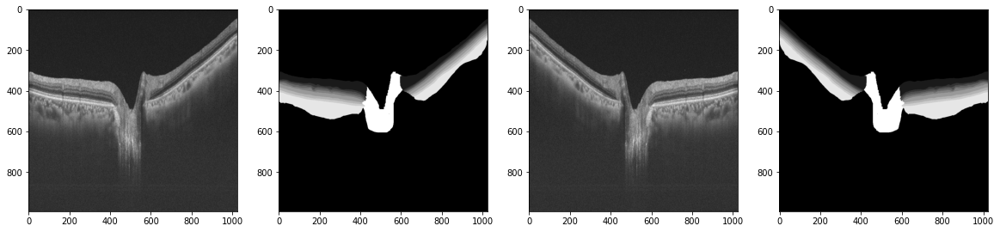

In [30]:
fig = plt.figure(figsize=(20, 10))
x, y = 1, 4

counter = 1
for i in range(int(y/2)):
    file_path_image = os.path.join(gcn_dataset, image, all_files[i] + ".bmp")
    file_path_label = os.path.join(gcn_dataset, label, all_files[i] + ".bmp")
    fig.add_subplot(x, y, counter)
    plt.imshow(cv2.imread(file_path_image, 0), cmap="gray")
    counter += 1
    fig.add_subplot(x, y, counter)
    plt.imshow(cv2.imread(file_path_label, 0), cmap="gray")
    counter += 1
plt.show()


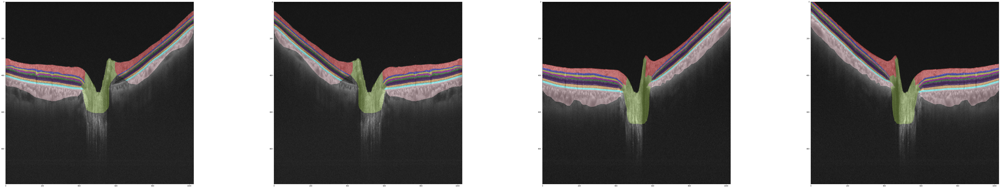

In [34]:
fig = plt.figure(figsize=(110, 20))
x, y = 1, 4

for i in range(int(y)):
    file_path_image = os.path.join(gcn_dataset, image, all_files[i] + ".bmp")
    file_path_label = os.path.join(gcn_dataset, label, all_files[i] + ".bmp")
    fig.add_subplot(x, y, i+1)
    plt.imshow(skimage.color.label2rgb(cv2.imread(file_path_label, 0), cv2.imread(file_path_image, 0)))
plt.show()

In [35]:
import tensorflow as tf

def one_hot_encode_mask(mask):
    """
    Converts mask to a one-hot encoding specified by the semantic map.
    """

    palette = [26, 51, 77, 102, 128, 153, 179, 204, 230, 255]
    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(mask, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)

    return one_hot_map

In [42]:
mask = tf.expand_dims(cv2.cvtColor(cv2.imread(os.path.join(gcn_dataset, label, all_files[0] + ".bmp")), cv2.COLOR_BGR2GRAY), -1)
print(mask.shape)
ohe_mask = one_hot_encode_mask(mask)
print(ohe_mask.shape)

(992, 1024, 1)
(992, 1024, 10)


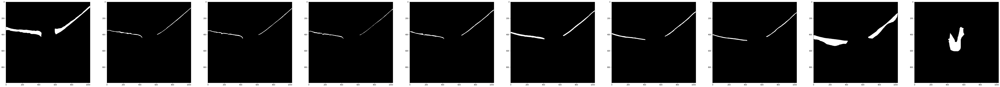

In [47]:
fig = plt.figure(figsize=(100, 20))
x, y = 1, ohe_mask.shape[-1]
for i in range(ohe_mask.shape[-1]):
    fig.add_subplot(x, y, i+1)
    plt.imshow(ohe_mask[..., i], cmap="gray")
plt.show()